# Measuring the state of accessibility to psychological care in Italy: a geospatial analysis approach



The project is an attempt to investigate the accessibility of public mental health care and treatment services in Italy.

The aim is to map physical places of access to free (or subsidized) psychological and psychiatric therapies, establish their geographical distribution across provinces and in cities, compare territorial units that are more or less served, and investigate effects/interactions with other geo-referenced socio-demographic variables.

Specifically, I will first use the **Consultori** Centers, and then hospital and clinical **health facilities** marked as such on OpenStreetMap, as proxies of public facilities where psychological care and treatment can be received.

After **geolocating** these facilities, and plotting them on maps of the national territory divided by provinces/highlighting clusters (data loading, processing, visualizing section), I develop a city-scale analysis of the places of care near a point of the user's choice with the routes to get there (street network analysis section).


## Dependencies

In [ ]:
from google.colab import drive
import os

In [ ]:
import pandas as pd
import numpy as np
import csv

In [ ]:
from geopy.geocoders import Nominatim

In [ ]:
import requests
import zipfile, io

In [ ]:
try:
  import geopandas as gpd
except ModuleNotFoundError as e:
  !pip install geopandas==0.10.1
  import geopandas as gpd

In [ ]:
try:
  import contextily
except ModuleNotFoundError as e:
  !pip install contextily==1.2.0
  import contextily

if contextily.__version__ != "1.2.0":
  !pip install -U contextily==1.2.0
  import contextily

In [ ]:
import contextily as ctx

In [ ]:
import folium
from folium.plugins import MarkerCluster

In [ ]:
try:
    import pygeos
except ModuleNotFoundError as e:
    !pip install pygeos==0.13
    import pygeos

In [ ]:
try:
    import osmnx  as ox
except ModuleNotFoundError as e:
    !pip install osmnx==1.2.2
    import osmnx  as ox
if ox.__version__ != "1.2.2":
    !pip install -U osmnx==1.2.2
    import osmnx  as ox

In [ ]:
import osmnx as ox
import matplotlib.pyplot as plt

In [ ]:
import networkx as nx

In [ ]:
try:
    import mapclassify
except ModuleNotFoundError as e:
    !pip install mapclassify
    import mapclassify

if mapclassify.__version__ != "2.4.3":
  !pip install -U mapclassify==2.4.3

In [ ]:
try:
  import pyrosm
except ModuleNotFoundError as e:
  !pip install pyrosm==0.6.1
  import pyrosm

## Data loading, processing, visualization

### Consultori

 "Consultori" centers are integrated social and health services with multidisciplinary expertise including free psychological care. They are here taken as a proxy for an accessible mental health care service.

The [dataset](https://www.dati.salute.gov.it/imgs/C_17_dataset_70_0_upFile.csv) contains the list of healthcare facilities (public and accredited private) providing "family counseling" care services (Consultori familiari) - year 2022, made available by the Ministry of Health, under [Italian Open Data Licence](https://www.dati.gov.it/content/italian-open-data-license-v20).

In [ ]:
# checks encoding
with open('consultori_C_17_dataset_70_0_upFile.csv') as f:
    print(f)

<_io.TextIOWrapper name='consultori_C_17_dataset_70_0_upFile.csv' mode='r' encoding='UTF-8'>


In [ ]:
consultori = pd.read_csv("consultori_C_17_dataset_70_0_upFile.csv",sep=';',encoding='latin-1')

In [ ]:
consultori['Tipo rapporto con il S.S.N.'].unique()

array(['Pubblico', 'Privato accreditato'], dtype=object)

**Georeferencing the Consultori facilities**

The following part is dedicated to the geolocation of the Consultori using Nominatim and ArcGis. As time consuming operations, intermediate results are saved and it is possible to run directly again from the chunk "Retrieving the dataframe of Consultori with geocoordinates".

In [ ]:
geolocator = Nominatim(user_agent="geospatial_project")

In [ ]:
consultori["location"] = consultori["Indirizzo"].apply(geolocator.geocode)

In [ ]:
consultori["point"] = consultori["location"].apply(lambda loc: tuple(loc.point) if loc else None)
consultori[['lat', 'lon', 'altitude']] = pd.DataFrame(consultori['point'].to_list(), index=consultori.index)

In [ ]:
os.chdir('..')
os.chdir('..')

In [ ]:
os.listdir('.')

In [ ]:
consultori['Indirizzo'][0].rstrip()+', '+consultori['Comune'][0].rstrip()+", IT"

'VIA ANTICA DI GRUGLIASCO 1/B, COLLEGNO, IT'

In [ ]:
consultori['Address'] = consultori['Indirizzo']+', '+consultori['Comune']+", IT"

TIME CONSUMING: execution time of next cell -> 17 min

In [ ]:
# time consuming cell, results are saved in the repository
consultori["loc"] = consultori["Address"].apply(geolocator.geocode)

In [ ]:
consultori

In [ ]:
consultori["point"]= consultori["loc"].apply(lambda loc: tuple(loc.point) if loc else None)
consultori[['lat', 'lon', 'altitude']] = pd.DataFrame(consultori['point'].to_list(), index=consultori.index)

In [ ]:
consultori

Saving dataframe to csv

In [ ]:
consultori.to_csv('/data/g_consultori.csv', index=False)

Retrieving the dataframe of Consultori with geocoordinates

In [ ]:
geoconsultori = pd.read_csv('/data/g_consultori.csv')

In [ ]:
geo_consultori = gpd.GeoDataFrame(
    geoconsultori,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(geoconsultori.lon, geoconsultori.lat))

In [ ]:
geo_consultori = geo_consultori.astype(object).replace(np.nan, 'None')

In [ ]:
m = folium.Map(location=[45, 12], zoom_start=7)
for i in range(0,len(geo_consultori)):
  if geo_consultori.iloc[i]['lat'] != "None" and geo_consultori.iloc[i]['lon'] != "None":
    folium.Marker(
        location=[geo_consultori.iloc[i]['lat'], geo_consultori.iloc[i]['lon']],
        popup=geo_consultori.iloc[i]['Comune']
      ).add_to(m)
m

In [ ]:
unknown_consultori = geo_consultori[geo_consultori.point=='None']

In [ ]:
unknown_consultori.shape

(922, 23)

922 consultori were not successfully geolocated. To retrieve those information I alternatively use Arcgis as provider.

In [ ]:
# to avoid losing lines with the operations I check how many consultants there are before doing the operations (e.g. in trentino: code 42)
geo_consultori[geo_consultori['Codice Regione']==42]
unknown_consultori[unknown_consultori['Codice Regione']==42]

,Anno,Codice Regione,Descrizione Regione,Codice ASL territoriale,Codice Azienda,Denominazione Azienda,Codice struttura,Denominazione struttura,Tipo rapporto con il S.S.N.,Indirizzo,...,Sigla provincia,Telefono,Sito web,Address,loc,point,lat,lon,altitude,geometry
430,2022,42,PROV. AUTON. TRENTO,101,101,TRENTO,030401,CONSULTORIO BORGO,Pubblico,"VIALE VICENZA, 9",...,TN,461755650,www.apss.tn.it,"VIALE VICENZA, 9, BORGO VALSUGANA ...",None,None,None,None,None,POINT EMPTY


#### Ri-georeferencing consultori with unknown location

The following part is dedicated to the ri-geolocating the Consultori left without location. As time consuming operations, intermediate results are saved and it is possible to run directly again from the chunk "Ritrieving intermediate results".

In [ ]:
c = unknown_consultori.Address[2]
point = gpd.tools.geocode(c, provider="arcgis")

In [ ]:
point.geometry.x

0    7.574527
dtype: float64

In [ ]:
c = unknown_consultori.Address

In [ ]:
points = gpd.tools.geocode(c, provider="arcgis")

In [ ]:
points[points.geometry=='None']

,geometry,address


In [ ]:
new_consultori  = unknown_consultori.merge(points,left_index=True,right_index=True)

In [ ]:
new_consultori = new_consultori.drop(['loc', 'point', 'lat',	'lon', 'Address','geometry_x'], axis=1)
new_consultori = new_consultori.rename(columns={"geometry_y": "geometry"})

In [ ]:
new_consultori.head()

In [ ]:
new_consultori.geometry[11].x

7.57940208026522

In [ ]:
new_consultori['lat'] = new_consultori['geometry'].apply(lambda loc: loc.y if loc else None)
new_consultori['lon'] = new_consultori['geometry'].apply(lambda loc: loc.x if loc else None)

In [ ]:
new_consultori.to_csv('/data/new_consultori.csv', index=False)

Ritrieving intermediate results

In [ ]:
new_consultori = pd.read_csv('/data/new_consultori.csv')

In [ ]:
new_geo_consultori = gpd.GeoDataFrame(
    new_consultori,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(new_consultori.lon, new_consultori.lat))

In [ ]:
new_geo_consultori = new_geo_consultori.astype(object).replace(np.nan, 'None')

In [ ]:
new_geo_consultori[new_geo_consultori['Codice Regione']==42]

,Anno,Codice Regione,Descrizione Regione,Codice ASL territoriale,Codice Azienda,Denominazione Azienda,Codice struttura,Denominazione struttura,Tipo rapporto con il S.S.N.,Indirizzo,...,Codice Comune,Comune,Sigla provincia,Telefono,Sito web,altitude,geometry,address,lat,lon
167,2022,42,PROV. AUTON. TRENTO,101,101,TRENTO,030401,CONSULTORIO BORGO,Pubblico,"VIALE VICENZA, 9",...,22022.0,BORGO VALSUGANA,TN,461755650,www.apss.tn.it,None,POINT (11.46287 46.05656),"Corso Vicenza 9, 38051, Borgo Valsugana, Trento",46.05656,11.46287


In [ ]:
geo_consultori[geo_consultori['Codice Regione']==42]

#### Ways to recombine data

In [ ]:
a = geo_consultori.merge(new_geo_consultori, on = ['Denominazione struttura'], how = 'left', suffixes=('_x', '_y'))

In [ ]:
conditions = [
    (a['geometry_y'] == None),
    (a['geometry_y'] != None)]
values = [a['geometry_x'], a['geometry_y']]

a['geometry'] = np.select(conditions, values)

# display updated DataFrame
a.head()

,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,Comune_y,Sigla provincia_y,Telefono_y,Sito web_y,altitude_y,geometry_y,address,lat_y,lon_y,geometry
0,2022,10,PIEMONTE,203,203,TO3,040074,P.G. CONSULTORIO GIOVANI - COL,Pubblico,VIA ANTICA DI GRUGLIASCO 1/B,...,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,POINT (7.5751959 45.071641)
1,2022,10,PIEMONTE,203,203,TO3,040078,P.G. CONSULTORIO ADOLESCENTI -,Pubblico,STRADA RIVALTA 14,...,NaN,NaN,NaN,NaN,NaN,None,NaN,NaN,NaN,POINT (7.5304326 45.0111209)
2,2022,10,PIEMONTE,203,203,TO3,040079,CONSULTORIO M.I. E PEDIATRICO,Privato accreditato,VIA LANZA TIZIANO 52,...,GRUGLIASCO,TO,114017616.0,WWW.ASLTO3.PIEMONTE.IT,None,POINT (7.57453 45.06343),"Via Tiziano Lanza 52, 10095, Grugliasco, Torino",45.063433,7.574527,POINT (7.574526623194067 45.063433109104224)
3,2022,10,PIEMONTE,203,203,TO3,040079,CONSULTORIO M.I. E PEDIATRICO,Privato accreditato,VIA LANZA TIZIANO 52,...,ORBASSANO,TO,119036480.0,WWW.ASLTO3.PIEMONTE.IT,None,POINT (7.54500 45.00727),"Piazza Carlo Alberto Dalla Chiesa, 10043, Orba...",45.007271,7.544999,POINT (7.544999390665952 45.00727105458581)
4,2022,10,PIEMONTE,203,203,TO3,040079,CONSULTORIO M.I. E PEDIATRICO,Privato accreditato,VIA LANZA TIZIANO 52,...,RIVALTA DI TORINO,TO,119091565.0,WWW.ASLTO3.PIEMONTE.IT,None,POINT (7.52342 45.03438),"Via Candido Balma 5, 10040, Rivalta di Torino,...",45.03438,7.52342,POINT (7.523420018853358 45.03437998939043)


In [ ]:
a.geometry.unique()

array([<POINT (7.575 45.072)>, <POINT (7.53 45.011)>,
       <POINT (7.575 45.063)>, ..., <POINT (9.177 39.377)>,
       <POINT (9.132 39.528)>, <POINT (9.567 39.421)>], dtype=object)

In [ ]:
a = a.astype(object).replace(np.nan, 'None')

In [ ]:
a[a.geometry_y != "None"].geometry_x # POINT EMPTY

In [ ]:
a['lat'] = a['geometry'].apply(lambda loc: loc.y if loc else None)
a['lon'] = a['geometry'].apply(lambda loc: loc.x if loc else None)

In [ ]:
new_geo_a = gpd.GeoDataFrame(
    a,
    crs='EPSG:4326',
    geometry=gpd.points_from_xy(a.lon, a.lat))

In [ ]:
new_geo_a.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
new_geo_a.drop(new_geo_a.filter(regex='_y$').columns, axis=1, inplace=True)

In [ ]:
new_geo_a[new_geo_a.geometry=="None"] # no missing geometries

,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,loc,point,lat_x,lon_x,altitude_x,geometry_x,address,geometry,lat,lon


In [ ]:
new_geo_a = new_geo_a.astype(object).replace(np.nan, 'None')

In [ ]:
m = folium.Map(location=[45, 12], zoom_start=7)
for i in range(0,len(new_geo_a)):
  if new_geo_a.iloc[i]['lat'] != "None" and new_geo_a.iloc[i]['lon'] != "None":
    folium.Marker(
        location=[new_geo_a.iloc[i]['lat'], new_geo_a.iloc[i]['lon']],
        popup=new_geo_a.iloc[i]['Comune_x']
      ).add_to(m)
m

### Italian cartographic data by regional, provincial, and municipal division

Italian administrative boundaries updated to January 1, 2023.

The [dataset](https://www.istat.it/storage/cartografia/confini_amministrativi/non_generalizzati/2023/Limiti01012023.zip) is published by Istat under [Creative Commons  - Attribution - 3.0](https://creativecommons.org/licenses/by/3.0/it/) licence.

In [ ]:
r = requests.get('https://www.istat.it/storage/cartografia/confini_amministrativi/non_generalizzati/2023/Limiti01012023.zip')

In [ ]:
# This cell can be avoided since data are already stored in the "data" folder
z = zipfile.ZipFile(io.BytesIO(r.content))
z.extractall()

In [ ]:
os.listdir('.')
os.chdir('data')

In [ ]:
os.listdir('.')
os.chdir('Limiti01012023')
os.listdir('.')

['Com01012023_g', 'ProvCM01012023_g', 'Reg01012023_g', 'RipGeo01012023_g']

In [ ]:
os.chdir('Com01012023')
os.listdir('.')
comuni = gpd.read_file('Com01012023_WGS84.shp',encoding='utf-8')

In [ ]:
os.chdir('..')
os.chdir('ProvCM01012023')
province = gpd.read_file('ProvCM01012023_WGS84.shp',encoding='utf-8')
os.chdir('..')
os.chdir('Reg01012023')
regioni = gpd.read_file('Reg01012023_WGS84.shp',encoding='utf-8')

In [ ]:
os.chdir('..')
os.chdir('..')

In [ ]:
comuni.head()

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,PRO_COM,PRO_COM_T,COMUNE,COMUNE_A,CC_UTS,Shape_Leng,geometry
0,1,1,1,201,201,1001,001001,Agliè,NaN,0,16097.848297,"POLYGON ((404703.558 5026682.655, 405359.554 5..."
1,1,1,1,201,201,1002,001002,Airasca,NaN,0,16684.218599,"POLYGON ((380700.909 4977305.520, 381105.998 4..."
2,1,1,1,201,201,1003,001003,Ala di Stura,NaN,0,29892.941951,"POLYGON ((364710.857 5022090.678, 364737.794 5..."
3,1,1,1,201,201,1004,001004,Albiano d'Ivrea,NaN,0,16192.656480,"POLYGON ((415942.504 5033304.609, 416079.315 5..."
4,1,1,1,201,201,1006,001006,Almese,NaN,0,16077.245089,"POLYGON ((376934.962 4999073.854, 376960.555 4..."


In [ ]:
province.head()

,COD_RIP,COD_REG,COD_PROV,COD_CM,COD_UTS,DEN_PROV,DEN_CM,DEN_UTS,SIGLA,TIPO_UTS,Shape_Area,geometry
0,1,1,1,201,201,-,Torino,Torino,TO,Citta metropolitana,6.828104e+09,"POLYGON ((411015.006 5049970.983, 411266.039 5..."
1,1,1,2,0,2,Vercelli,-,Vercelli,VC,Provincia,2.082097e+09,"POLYGON ((438328.612 5087208.215, 439028.888 5..."
2,1,1,3,0,3,Novara,-,Novara,NO,Provincia,1.341318e+09,"POLYGON ((460929.542 5076320.298, 461165.259 5..."
3,1,1,4,0,4,Cuneo,-,Cuneo,CN,Provincia,6.898501e+09,"MULTIPOLYGON (((378673.492 4958865.159, 378928..."
4,1,1,5,0,5,Asti,-,Asti,AT,Provincia,1.508923e+09,"POLYGON ((425041.329 4997628.309, 424948.989 4..."


In [ ]:
regioni.head()

In [ ]:
province.plot(facecolor='None',edgecolor='red')

In the following part, we use MakerCluster map with Folium to facilitate interactive cluster detection and inspection.

In [ ]:
import folium
from folium.plugins import MarkerCluster

In [ ]:
centerx = regioni.to_crs(epsg=4326).unary_union.centroid.x
centery = regioni.to_crs(epsg=4326).unary_union.centroid.y

In [ ]:
def getMarker(lat,lon, message):
    marker = folium.Marker(location=[lat,lon],popup=message)
    return marker

In [ ]:
webmapcluster=folium.Map(location=[centery,centerx],tiles='cartodbpositron',zoom_start=7)

In [ ]:
marker_cluster = MarkerCluster().add_to(webmapcluster)

In [ ]:
geo_consultori[geo_consultori['Codice Regione']==42.]

,Anno,Codice Regione,Descrizione Regione,Codice ASL territoriale,Codice Azienda,Denominazione Azienda,Codice struttura,Denominazione struttura,Tipo rapporto con il S.S.N.,Indirizzo,...,Sigla provincia,Telefono,Sito web,Address,loc,point,lat,lon,altitude,geometry
167,2022.0,42.0,PROV. AUTON. TRENTO,101.0,101.0,TRENTO,030401,CONSULTORIO BORGO,Pubblico,"VIALE VICENZA, 9",...,TN,461755650.0,www.apss.tn.it,"VIA MANZONI, 5 , BINASCO ...",None,None,46.05656,11.46287,None,POINT (11.46287 46.05656)


In [ ]:
#for index, row in geo_consultori.iterrows():
for index, row in new_geo_a.iterrows():
  if row['lat'] != "None" and row['lon'] != "None":
    marker = getMarker(row['lat'],row['lon'],row['Comune_x']+row['Tipo rapporto con il S.S.N._x'])
    marker.add_to(marker_cluster)

In [ ]:
webmapcluster

## Street network analysis

For the following part, I identified a generic point in a generic city (Udine) to test the functions developped to: identify health care places in the zone, compute their proximity to the user, and extract the shortest routes to get there.

#### Streets

In [ ]:
# input data
street = 'Via Marco Volpe 4'
city = 'Udine'
region = 'Friuli-Venezia Giulia'
nation = 'Italy'

# geocoding function
def address_geo(strt, city, region, nation='italy'):
  ad = strt+', '+city+', '+region+', '+nation
  point = gpd.tools.geocode(ad, provider="arcgis")
  return point, ad

location, address = address_geo(street,city,region,nation)

In [ ]:
# the point used as origin location for the present simulation
origin_location = location
origin_location

,geometry,address
0,POINT (13.22897 46.06110),"Via Marco Volpe 4, 33100, Udine"


In [ ]:
street_origin = city+', '+region+', '+nation
street_origin

'Udine, Friuli-Venezia Giulia, Italy'

In [ ]:
#G = ox.graph_from_place('Udine, Friuli-Venezia Giulia, Italy', network_type='all')
G = ox.graph_from_place(street_origin, network_type='all')

In [ ]:
G_proj = ox.project_graph(G)

In [ ]:
gdfs = ox.graph_to_gdfs(G_proj)

In [ ]:
nodes_proj = ox.graph_to_gdfs(G_proj, edges=False, nodes=True)

In [ ]:
lines_proj = ox.graph_to_gdfs(G_proj, nodes=False)

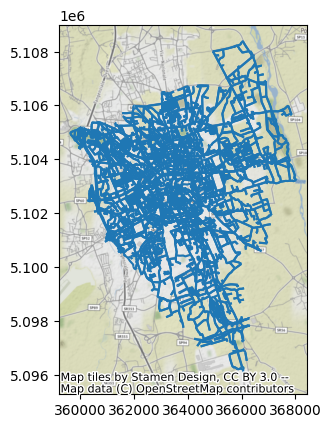

In [ ]:
ax = lines_proj.plot()
ctx.add_basemap(ax, crs=lines_proj.crs)
plt.show()

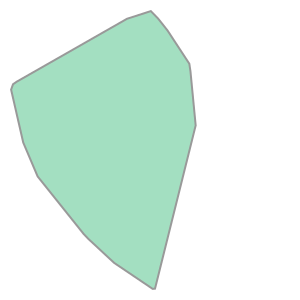

In [ ]:
area_ud = nodes_proj.unary_union.convex_hull.area
polygon_ud = nodes_proj.unary_union.convex_hull
polygon_ud

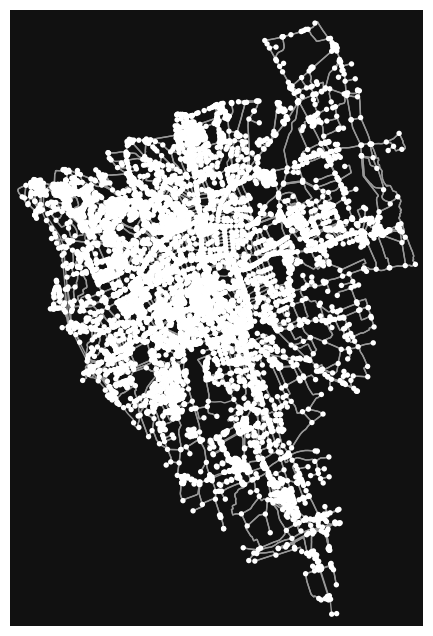

In [ ]:
fig, ax = ox.plot_graph(G)
plt.show()

In [ ]:
# add speeds and calculate edge travel times (with speed module)
G = ox.speed.add_edge_speeds(G)
G = ox.speed.add_edge_travel_times(G)

In [ ]:
GW = ox.graph_from_place('Udine, Friuli-Venezia Giulia, Italy', network_type='walk')

In [ ]:
GW_proj = ox.project_graph(GW)

In [ ]:
GW = ox.add_edge_speeds(GW)
GW = ox.add_edge_travel_times(GW)

In [ ]:
edges = ox.graph_to_gdfs(GW,edges=True,nodes=False)

In [ ]:
point_nearest_origin = ox.distance.nearest_nodes(GW,Y=origin_location.geometry[0].y,X=origin_location.geometry[0].x)

#### Isochrones

After extracting and displaying the city's street network, I plot the isochrones for 10/20/30 minute walking distances (5 km/h) here.

In [ ]:
trip_times = [10, 20, 30]  # in minutes
travel_speed = 5 # 4 -> walking speed in km/hour, 8-15 -> cycling speed
from shapely.geometry import Point

In [ ]:
center_node = point_nearest_origin

In [ ]:
meters_per_minute = travel_speed * 1000 / 60  # km per hour to m per minute
for orig,dest, p, data in GW_proj.edges(data=True, keys=True):
    data["time"] = data["length"] / meters_per_minute

In [ ]:
# make the isochrone polygons
isochrone_polys = []
for trip_time in sorted(trip_times, reverse=True):
    subgraph = nx.ego_graph(GW_proj, center_node, radius=trip_time, distance="time")
    node_points = [Point((data["x"], data["y"])) for node, data in subgraph.nodes(data=True)]
    bounding_poly = gpd.GeoSeries(node_points).unary_union.convex_hull
    isochrone_polys.append(bounding_poly)

In [ ]:
crs_proj = ox.graph_to_gdfs(GW_proj)[0].crs

In [ ]:
data = {'trip_time': sorted(trip_times, reverse=True), 'geometry': isochrone_polys}
isochrones = gpd.GeoDataFrame(data,crs=crs_proj)

In [ ]:
isochrones.explore(column='trip_time',cmap='Reds')

In [ ]:
isochrones.crs

<Projected CRS: +proj=utm +zone=33 +ellps=WGS84 +datum=WGS84 +unit ...>
Name: unknown
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- undefined
Coordinate Operation:
- name: UTM zone 33N
- method: Transverse Mercator
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

#### Shortest path - general

In case of no mental health facilities inside the delimited zone, the designated destination might be the "pronto soccorso" at the closest hospital, retrieved through OSM amenity=hospital, amenity=clinic.

In [ ]:
destination_location = gpd.tools.geocode('Pronto Soccorso Udine, Udine, Friuli-Venezia Giulia', provider='nominatim',user_agent='geospatial_project')

In [ ]:
destination_location

,geometry,address
0,POINT (13.22885 46.07736),"Pronto Soccorso Udine, 1, Piazzale Santa Maria..."


In [ ]:
origin_location, destination_location

(                    geometry                          address
 0  POINT (13.22897 46.06110)  Via Marco Volpe 4, 33100, Udine,
                     geometry  \
 0  POINT (13.22885 46.07736)   
 
                                              address  
 0  Pronto Soccorso Udine, 1, Piazzale Santa Maria...  )

In [ ]:
point_nearest_origin = ox.distance.nearest_nodes(GW,Y=origin_location.geometry[0].y,X=origin_location.geometry[0].x)
point_nearest_destination = ox.distance.nearest_nodes(GW,Y=destination_location.geometry[0].y,X=destination_location.geometry[0].x)

In [ ]:
route = ox.shortest_path(GW, point_nearest_origin, point_nearest_destination, weight="travel_time")

In [ ]:
nodes = ox.graph_to_gdfs(GW,edges=False,nodes=True)

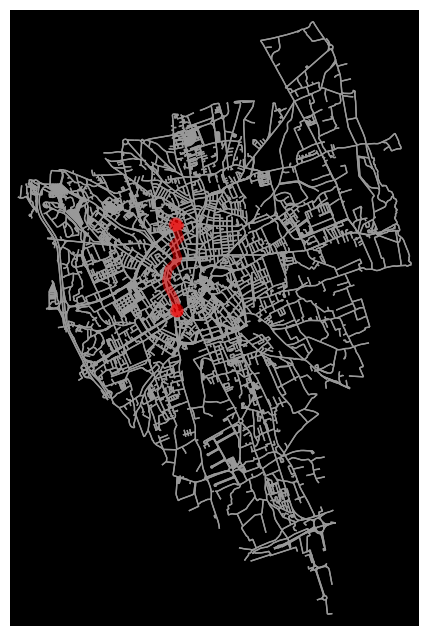

In [ ]:
fig, ax = ox.plot_graph_route(GW, route, route_linewidth=6, node_size=0, bgcolor='k')
plt.show()

In [ ]:
ox.plot_route_folium(GW,route,popup_attribute='name',tiles='OpenStreetMap')

In [ ]:
edge_lengths = ox.utils_graph.get_route_edge_attributes(GW, route, 'length')
sum(edge_lengths)

2378.919

In [ ]:
import datetime

In [ ]:
edge_times = ox.utils_graph.get_route_edge_attributes(GW, route, 'travel_time')
seconds = sum(edge_times)

In [ ]:
str(datetime.timedelta(seconds=seconds))

'0:03:03.500000'

In the sections that follow, I will extract the healthcare facilities marked as such by OSM, overplot them to the Consultori facilities and then identify the healthcare facilities in general within a 30-minute walk, extract the nearest one and the shortest way to get there.

#### Custom OSM filter to extract healthcare facilities

In [ ]:
ud = 'https://osmit-estratti.wmcloud.org/dati/poly/comuni/pbf/030129_Udine.osm.pbf'

import requests
r = requests.get(ud, allow_redirects=True)
open('udine.pbf', 'wb').write(r.content)

2994977

In [ ]:
from pyrosm import OSM, get_data

osm = OSM("udine.pbf")

my_filter = {"building": ["hospital","clinic"]}
buildings = osm.get_buildings(custom_filter=my_filter)

# Plot
title = "Filtered buildings: " + ", ".join(buildings["building"].unique())
#ax = buildings.plot(cmap="RdBu", legend=True)

buildings.explore(column="building", cmap="RdBu", legend=True)
#ax.set_title(title);
#ctx.add_basemap(ax, crs=buildings.crs)

/usr/local/lib/python3.10/dist-packages/geopandas/array.py:1486: UserWarning: CRS not set for some of the concatenation inputs. Setting output's CRS as WGS 84 (the single non-null crs provided).
  warnings.warn(


In [ ]:
my_filter={"healthcare": ["hospital", "clinic","psychoterapist"],"area":True}
#my_filter={"healthcare":["counselling","psychoterapist"]}
pois = osm.get_pois(custom_filter=my_filter)
#pois.explore(column="building", cmap="RdBu", legend=True)
pois.explore(cmap="RdBu", legend=True)

/usr/local/lib/python3.10/dist-packages/pyrosm/pyrosm.py:576: ShapelyDeprecationWarning: The array interface is deprecated and will no longer work in Shapely 2.0. Convert the '.coords' to a numpy array instead.
  gdf = get_poi_data(


<Axes: >

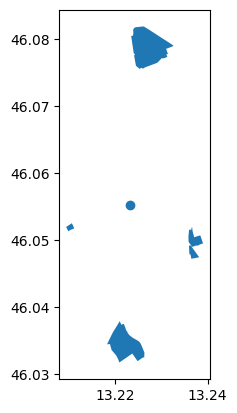

In [ ]:
pois.plot()

Delimiting the 30 minutes walk area, to identify the services within the zone.

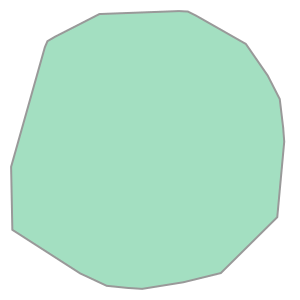

In [ ]:
isochrones[isochrones.trip_time==30].geometry.values[0]

In [ ]:
area_30 = isochrones[isochrones.trip_time==30]
area_30 = area_30.to_crs(4326)

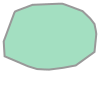

In [ ]:
area_30.geometry.values[0]

In [ ]:
pois.shape

(5, 11)

In [ ]:
pois_30area = pois[pois.geometry.within(area_30.geometry.values[0]) | pois.geometry.overlaps(area_30.geometry.values[0])]

In [ ]:
pois_30area.shape

(4, 11)

In [ ]:
consultori_30area = new_geo_a[new_geo_a.geometry.within(area_30.geometry.values[0]) | new_geo_a.geometry.overlaps(area_30.geometry.values[0])]

/usr/local/lib/python3.10/dist-packages/pygeos/predicates.py:906: RuntimeWarning: invalid value encountered in within
  return lib.within(a, b, **kwargs)
/usr/local/lib/python3.10/dist-packages/pygeos/predicates.py:818: RuntimeWarning: invalid value encountered in overlaps
  return lib.overlaps(a, b, **kwargs)


In [ ]:
consultori_30area

,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,loc,point,lat_x,lon_x,altitude_x,geometry_x,address,geometry,lat,lon
938,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,25VH24,CONS. FAM. UDINE,Pubblico,"VIA S.VALENTINO, 18",...,"18, Via San Valentino, Borgo Pracchiuso, Udine...","(46.0669421, 13.2435027, 0.0)",46.066942,13.243503,0.0,POINT (13.2435027 46.0669421),None,POINT (13.24350 46.06694),46.066942,13.243503
939,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V69P,Consultorio Familiare 'Friuli ETS',Privato accreditato,"Vicolo Stabernao, 7",...,"7, Vicolo Stabernao, Borgo Aquileia, Udine, Fr...","(46.0610712, 13.2413058, 0.0)",46.061071,13.241306,0.0,POINT (13.2413058 46.0610712),None,POINT (13.24131 46.06107),46.061071,13.241306
940,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V79Q,"Consultorio Familiare ""AIED""",Privato accreditato,"VIA G.B. BASSI, 64-66",...,None,None,None,None,None,POINT EMPTY,"Viale Gio Batta Bassi 64, 33100, Udine",POINT (13.22801 46.07006),46.070062,13.228013
941,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V89R,Consultorio Familiare 'Udinese-APS',Privato accreditato,"Viale XXIII Marzo 1848, 44",...,None,None,None,None,None,POINT EMPTY,"Viale 23 Marzo 1848 44, 33100, Udine",POINT (13.24696 46.05759),46.05759,13.24696


Delimiting the city area using the city-network unary_union.convex_hull shape, to identify the services within the zone.

In [ ]:
# not working
df_ud = pd.DataFrame(data={'name': ['udine'], 'geometry': [polygon_ud]})
poly_ud = gpd.GeoDataFrame(
    df_ud,
    crs='EPSG:25832',
    geometry=df_ud.geometry)
poly_ud = poly_ud.to_crs(4326)
ax = poly_ud.plot()
ctx.add_basemap(ax,crs=poly_ud.crs)

In [ ]:
# not working
new_geo_a[new_geo_a.geometry.within(poly_ud.geometry.values[0])]

/usr/local/lib/python3.10/dist-packages/pygeos/predicates.py:906: RuntimeWarning: invalid value encountered in within
  return lib.within(a, b, **kwargs)


,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,loc,point,lat_x,lon_x,altitude_x,geometry_x,address,geometry,lat,lon


Delimiting the city area through administrative borders, to identify the services within the zone.
Selecting the Consultori within Udine administrative unit.

In [ ]:
ud_comune = comuni[comuni.COMUNE=='Udine']
ud_comune = ud_comune.to_crs(4326)
ud_comune.geometry.values[0]
consultori_ud = new_geo_a[new_geo_a.geometry.within(ud_comune.geometry.values[0])]

/usr/local/lib/python3.10/dist-packages/pygeos/predicates.py:906: RuntimeWarning: invalid value encountered in within
  return lib.within(a, b, **kwargs)


In [ ]:
consultori_ud

,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,loc,point,lat_x,lon_x,altitude_x,geometry_x,address,geometry,lat,lon
938,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,25VH24,CONS. FAM. UDINE,Pubblico,"VIA S.VALENTINO, 18",...,"18, Via San Valentino, Borgo Pracchiuso, Udine...","(46.0669421, 13.2435027, 0.0)",46.066942,13.243503,0.0,POINT (13.2435027 46.0669421),None,POINT (13.24350 46.06694),46.066942,13.243503
939,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V69P,Consultorio Familiare 'Friuli ETS',Privato accreditato,"Vicolo Stabernao, 7",...,"7, Vicolo Stabernao, Borgo Aquileia, Udine, Fr...","(46.0610712, 13.2413058, 0.0)",46.061071,13.241306,0.0,POINT (13.2413058 46.0610712),None,POINT (13.24131 46.06107),46.061071,13.241306
940,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V79Q,"Consultorio Familiare ""AIED""",Privato accreditato,"VIA G.B. BASSI, 64-66",...,None,None,None,None,None,POINT EMPTY,"Viale Gio Batta Bassi 64, 33100, Udine",POINT (13.22801 46.07006),46.070062,13.228013
941,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V89R,Consultorio Familiare 'Udinese-APS',Privato accreditato,"Viale XXIII Marzo 1848, 44",...,None,None,None,None,None,POINT EMPTY,"Viale 23 Marzo 1848 44, 33100, Udine",POINT (13.24696 46.05759),46.05759,13.24696


In [ ]:
origin_location.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [ ]:
m = ox.plot_route_folium(GW, route,tiles='OpenStreetMap')
m = area_30.explore(m=m, name='area 30')
m = pois.explore(m=m,color='black',name="Medical Facilities")
m = consultori_ud.geometry.explore(m=m, color="red", name="Consultori")
m = origin_location.explore(m=m,color='blue',name='YOU ARE HERE')
folium.LayerControl().add_to(m)
m

#### Closest facility within 30 min walk
Among the facilities withing a 30 min walk area, identify the closest to the origin point, attributed as the destination in the shortest path research.

##### Closest OSM health facility

In [ ]:
pois_30area.shape, consultori_30area.shape

((4, 11), (4, 27))

In [ ]:
pois_30area

In [ ]:
def node_nearest_location(location):
  return ox.distance.nearest_nodes(GW,Y=location.centroid.y,X=location.centroid.x)
pois_30area['node'] = pois_30area['geometry'].apply(node_nearest_location)

In [ ]:
pois_30area.node[0]
route0 = ox.shortest_path(GW, point_nearest_origin, pois_30area.node[0], weight="travel_time")
route0

8198783484

In [ ]:
def shortest_from_origin(node):
  return ox.shortest_path(GW, point_nearest_origin, node, weight="travel_time")
pois_30area['shortest_route'] = pois_30area['node'].apply(shortest_from_origin)

In [ ]:
def each_edge_lengths(route):
  edge_lengths = ox.utils_graph.get_route_edge_attributes(GW, route, 'length')
  return sum(edge_lengths)
def each_edge_times(route):
  edge_times = ox.utils_graph.get_route_edge_attributes(GW, route, 'travel_time')
  return sum(edge_times)

In [ ]:
pois_30area['shortest_route_length'] = pois_30area['shortest_route'].apply(each_edge_lengths)
pois_30area['shortest_route_time'] = pois_30area['shortest_route'].apply(each_edge_times)

In [ ]:
destination = pois_30area[pois_30area.shortest_route_length==min(pois_30area.shortest_route_length)]
destination

,lat,lon,timestamp,tags,changeset,id,version,name,geometry,osm_type,operator,node,shortest_route,shortest_route_length,shortest_route_time
0,46.055241,13.223203,1535633988,"{""amenity"":""hospital"",""healthcare"":""hospital""}",0.0,5868405476,1,Policlinico Città di Udine Polo 2,POINT (13.22320 46.05524),node,NaN,8198783484,"[6627649719, 461805772, 5920485701, 2343876015...",1042.646,92.9


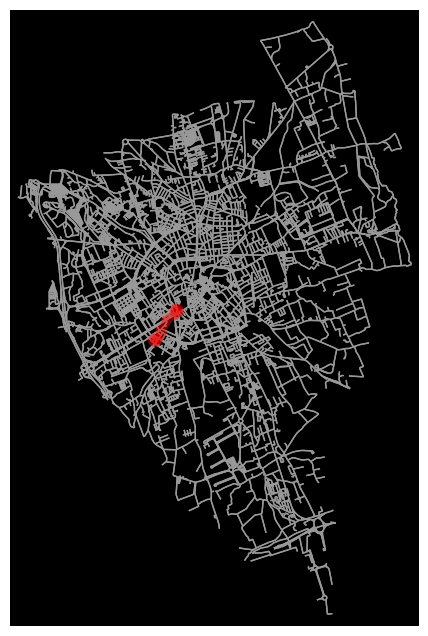

In [ ]:
fig, ax = ox.plot_graph_route(GW, destination.shortest_route[0], route_linewidth=6, node_size=0, bgcolor='k')
plt.show()

In [ ]:
ox.plot_route_folium(GW,destination.shortest_route[0],popup_attribute='name',tiles='OpenStreetMap')

##### Closest consultorio

In [ ]:
consultori_30area
consultori_30area['node'] = consultori_30area['geometry'].apply(node_nearest_location)
consultori_30area['shortest_route'] = consultori_30area['node'].apply(shortest_from_origin)
consultori_30area['shortest_route_length'] = consultori_30area['shortest_route'].apply(each_edge_lengths)
consultori_30area['shortest_route_time'] = consultori_30area['shortest_route'].apply(each_edge_times)

In [ ]:
destination = consultori_30area[consultori_30area.shortest_route_length==min(consultori_30area.shortest_route_length)]
destination

,Anno_x,Codice Regione_x,Descrizione Regione_x,Codice ASL territoriale_x,Codice Azienda_x,Denominazione Azienda_x,Codice struttura_x,Denominazione struttura,Tipo rapporto con il S.S.N._x,Indirizzo_x,...,altitude_x,geometry_x,address,geometry,lat,lon,node,shortest_route,shortest_route_length,shortest_route_time
939,2022,60,FRIULI VENEZIA GIULIA,206,206,ASU FRIULI CENTRALE,92V69P,Consultorio Familiare 'Friuli ETS',Privato accreditato,"Vicolo Stabernao, 7",...,0.0,POINT (13.2413058 46.0610712),None,POINT (13.24131 46.06107),46.061071,13.241306,498342953,"[6627649719, 461805772, 461810322, 4638679272,...",1163.235,94.8


In [ ]:
destination.shortest_route.iloc[0]

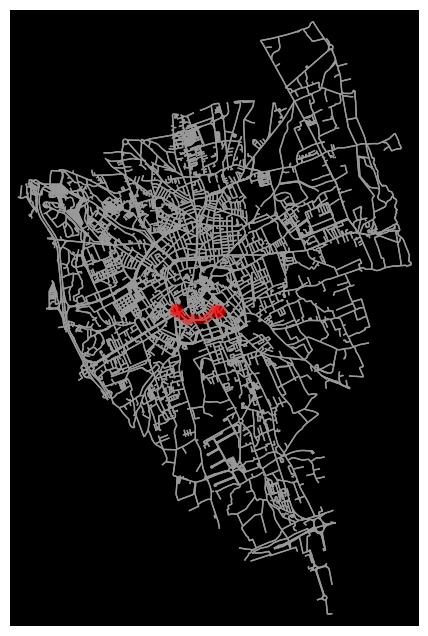

In [ ]:
fig, ax = ox.plot_graph_route(GW, destination.shortest_route.iloc[0], route_linewidth=6, node_size=0, bgcolor='k')
plt.show()

In [ ]:
ox.plot_route_folium(GW,destination.shortest_route.iloc[0],popup_attribute='name',tiles='OpenStreetMap')